In [1]:
import tensorflow as tf
import sys

sys.path.append('../')

from src.Objective import Objective
from src.Parameterization import Parameterization, get_fft_scale, fft_to_rgb
from src.Transformation import *
from src.Regularizer import *
from src.Optimizer import *
from src.Miscellaneous import *
from src.Attribution import *
from src.Wrapper import *

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Model selection

In [2]:
# Model names: https://keras.io/api/applications/

model = Wrapper(model = 'VGG19')

print(model.layers())

['input_1', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_conv4', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_conv4', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4', 'block5_pool', 'flatten', 'fc1', 'fc2', 'predictions']


# L1 normalization

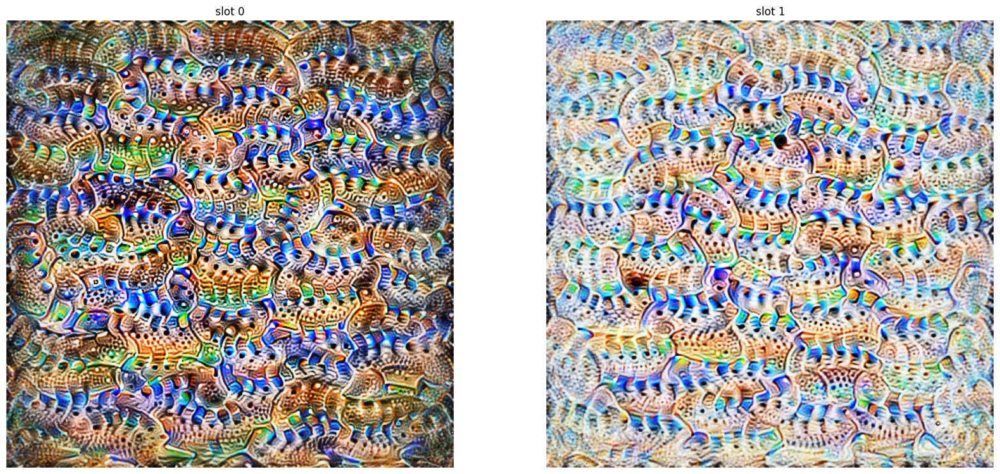

In [3]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
regularizers = [L1(1e-1)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)

# L2 normalization

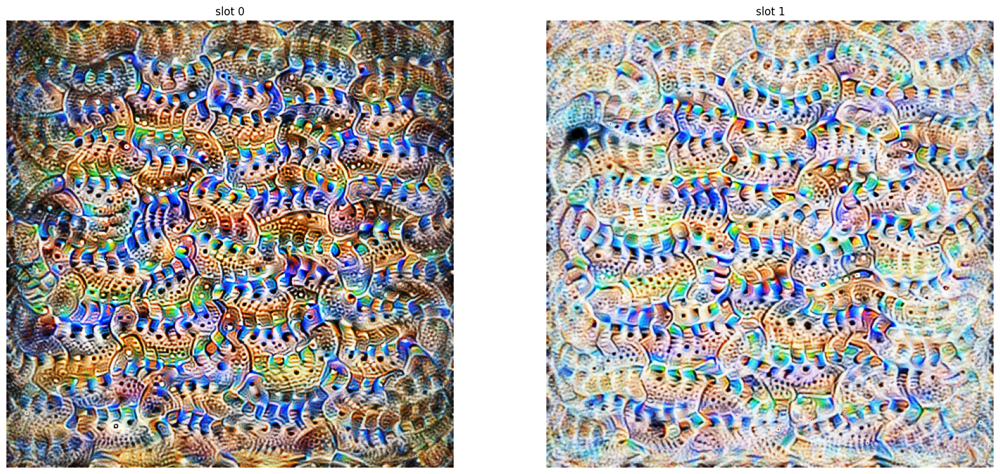

In [4]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
regularizers = [L2(0.1)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)

# Linfinity Normalization

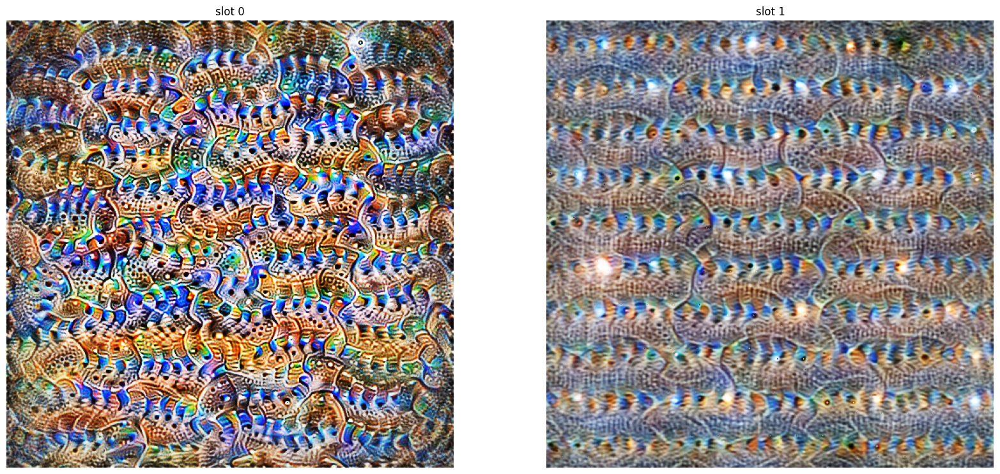

In [5]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
regularizers = [Linf(1)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)

# Image total variation

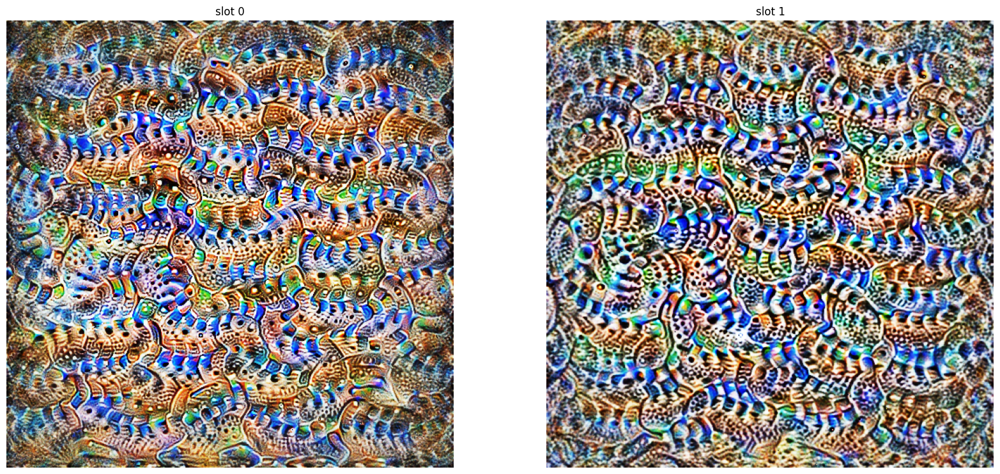

In [6]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
regularizers = [total_variation(5e-6)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)

# Image boundary complexity penalization

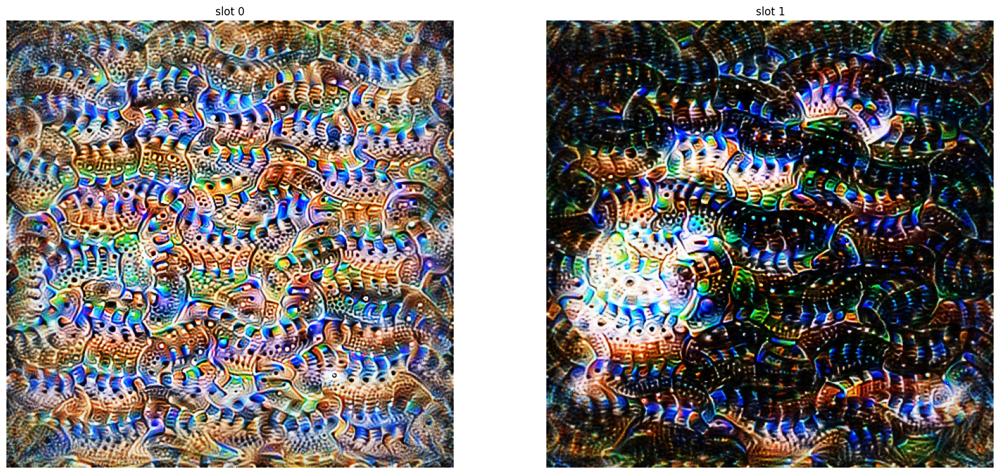

In [7]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
regularizers = [boundary_complexity(factor = 9e-7)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)

# Gaussian kernel difference for edge detection

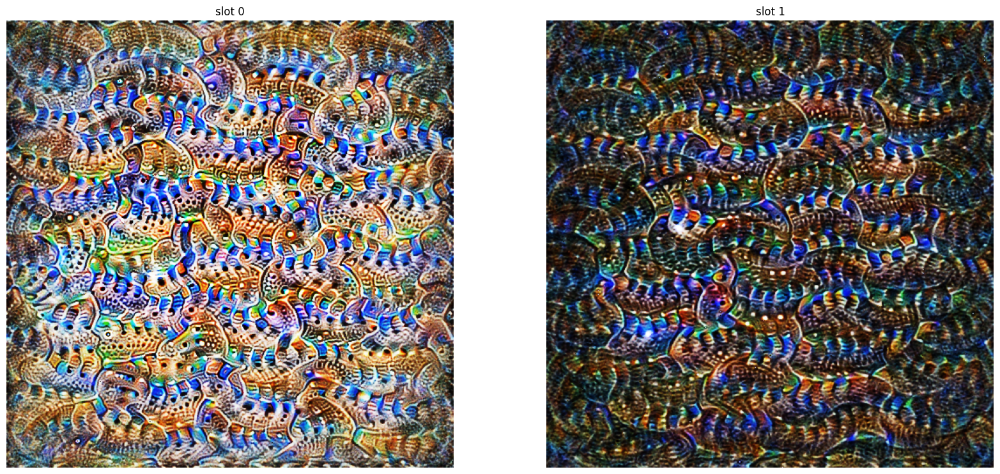

In [8]:
# Layer name
layer = 'block5_conv4'

# this value were chosen by hand for this specific objective, other objectives may use different factors
# kernels with size 7 and 3
regularizers = [gauss_diff(7, 3, 1e-4)]

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = []

# Original output vs Regularizer output
for regularizer in [None] + regularizers:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      regularizers = [] if regularizer is None else [regularizer],
                      verbose = False)[0])
    
plot_all(images)